In [1]:
using Plots
using CSV
using DataFrames
using LaTeXStrings
#using FileIO
#using JLD2

In [2]:
# Reference the in-tree version of CalibrateEmulateSample on Julias load path
prepend!(LOAD_PATH, [joinpath(@__DIR__, "..", "..", "CalibrateEmulateSample.jl")])
include(joinpath(@__DIR__, "..",  "..", "CalibrateEmulateSample.jl", "examples", "ci", "linkfig.jl"))

linkfig (generic function with 1 method)

In [3]:
# Import Calibrate-Emulate-Sample modules
using CalibrateEmulateSample.EnsembleKalmanProcessModule
using CalibrateEmulateSample.Emulators
using CalibrateEmulateSample.MarkovChainMonteCarlo
using CalibrateEmulateSample.Observations
using CalibrateEmulateSample.Utilities
using CalibrateEmulateSample.ParameterDistributionStorage
using CalibrateEmulateSample.DataStorage

In [4]:
using Random
using Statistics
using Distributions
using Measures

## Open all files
We need ground truth, parameter lists and QBO output (period/amplitude) files.

In [7]:
# Get observations ("truth" in the perfect model setting)
y_names = ["period", "amplitude"]

y_lims = [(10, 30), (20, 40)]

truthdir = "/home/users/lauraman/EKI_OBS/ground_truth_data"
truth_filename = "QBO_TT_metrics_ground_truth.csv"

filepath_truth = "$(truthdir)/$(truth_filename)"
df_truth = DataFrame(CSV.File(filepath_truth))
yt_ = zeros(length(y_names))
for (y_index, y_name) in enumerate(y_names)
    yt_[y_index] = df_truth[1, y_name]
end

# Also get variance for truth 
y_names_var = ["cov_00", "cov_01", "cov_10", "cov_11"]
yt_var_ = zeros(length(y_names), length(y_names))
yt_var_[1, 1] = df_truth[1, "cov_00"]
yt_var_[1, 2] = df_truth[1, "cov_01"]
yt_var_[2, 1] = df_truth[1, "cov_10"]
yt_var_[2, 2] = df_truth[1, "cov_11"]


truth = yt_
Γy = yt_var_

2×2 Matrix{Float64}:
 0.612959  0.225643
 0.225643  0.309233

In [8]:
truth

2-element Vector{Float64}:
 27.475158018456685
 26.47962962962963

In [71]:
## Get parameters and outputs
N_ens = 50 # number of ensemble members
N_iter = 4 # number of EKI iterations done so far (must be completed!)

4

In [72]:
# Get the input parameters 
println("Get inputs")
u_names = ["cwtropics", "Bt_eq"]
n_params = length(u_names)

# Get ensemble parameter inputs from txt file
u = zeros(N_iter, N_ens, n_params);
basedir = "/scratch/users/lauraman/EKI/"

for iter in 0:(N_iter-1) 
    paramlist = ("$(basedir)/iteration_$(iter)/paramlist.csv")
    df_params = DataFrame(CSV.File(paramlist))
    u[iter+1, 1:N_ens, 1] = df_params[!, u_names[1]]
    u[iter+1, 1:N_ens, 2] = df_params[!, u_names[2]]
end

u

Get inputs


4×50×2 Array{Float64, 3}:
[:, :, 1] =
 21.439   44.9224   5.88822  35.6561  …  16.9455  43.4489  11.4748  42.0912
 25.8511  35.4445  20.4686   21.9342     13.4696  57.0666  17.8707  26.5192
 32.5813  42.2329  25.4803   32.9504     25.6129  45.0417  38.5643  34.841
 39.9418  44.574   32.2853   35.8232     43.8112  43.9945  59.2328  37.3147

[:, :, 2] =
 0.00337036  0.00470093  0.00260769  …  0.00140897  0.00627031  0.00590358
 0.00365945  0.00355175  0.0047656      0.00272201  0.00681838  0.00401715
 0.00304502  0.00257321  0.00425592     0.00315567  0.00524459  0.00326666
 0.00244356  0.00239272  0.00350761     0.00284244  0.00270159  0.00284409

In [73]:
# Get outputs from file
println("Get outputs")
g_names = y_names
n_outputs = length(g_names)
g_ens = zeros(N_iter, N_ens, n_outputs)
filename = "QBO_TT_metrics.csv"

for iter in 0:(N_iter-1) 
    for ens_index in 0:(N_ens-1)
        filepath_out = "$(basedir)/iteration_$(iter)/$(ens_index)/$(filename)"
        df_out = DataFrame(CSV.File(filepath_out))
        colnames = names(df_out)
        for (g_index, g_name) in enumerate(g_names)
            g_ens[iter+1, ens_index+1, g_index] = df_out[1, g_name]
        end 
    end
end


g_ens


Get outputs


4×50×2 Array{Float64, 3}:
[:, :, 1] =
 21.8481  25.0534  45.0927  21.6318  …  22.0838  21.6475  23.0551  22.3453
 25.0121  26.7376  24.0257  24.3926     23.1428  29.7519  21.2935  25.2589
 25.1008  26.1313  25.3311  27.1973     21.9446  30.354   23.8501  27.3766
 25.8999  23.2515  25.7307  25.1471     29.2835  26.0741  30.4115  25.3985

[:, :, 2] =
 22.4763  35.6588  13.405   38.3705  …  28.7006  12.9715  20.4115  40.5454
 26.9352  31.1363  27.7846  29.1618     23.053   28.1895  30.3546  29.2275
 28.1735  27.3123  29.8432  29.7141     36.0634  30.0783  38.3662  28.426
 23.8579  23.6509  28.2692  27.229      31.7978  28.2163  25.3628  27.0852

In [74]:
# Get training points
# Reshape u and g so that n_params and n_outputs come in first dimension
u_tp = permutedims(u, (3, 2, 1))
g_tp = permutedims(g_ens, (3, 2, 1))

## Condense the iterations and ensembles to create one large training dataset
u_tp = reshape(u_tp, (n_params, N_ens * N_iter) )
g_tp = reshape(g_tp, (n_outputs, N_ens * N_iter))

input_output_pairs = PairedDataContainer(u_tp, g_tp, data_are_columns=true)
@assert get_inputs(input_output_pairs) == u_tp
@assert get_outputs(input_output_pairs) == g_tp

In [94]:
plotdir="/scratch/users/lauraman/EKI/PLOTS/"

"/scratch/users/lauraman/EKI/PLOTS/"

In [75]:
## Save if you want
##@save joinpath(output_directory, "input_output_pairs.jld2") input_output_pairs


In [76]:
println(" **** EMULATE ****")
println("Starting Gaussian Process Regression")
gppackage = Emulators.GPJL()
pred_type = Emulators.YType()
gauss_proc = GaussianProcess(
    gppackage; 
    kernel=nothing, # use default squared exponential kernel
    prediction_type=pred_type, 
    noise_learn=false
)


emulator = Emulator(
    gauss_proc,
    input_output_pairs,
    obs_noise_cov=Γy,
    normalize_inputs=true
)
optimize_hyperparameters!(emulator)

 **** EMULATE ****
Starting Gaussian Process Regression
Using default squared exponential kernel, learning length scale and variance parameters
Using default squared exponential kernel: Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]
kernel in GaussianProcess:
Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]
created GP: 1
kernel in GaussianProcess:
Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]
created GP: 2
LinearAlgebra.PosDefException(2)
optimized hyperparameters of GP: 1
Type: GaussianProcesses.SEArd{Float64}, Params: [-0.24476904669013844, 0.7975452160881968, 3.4429985016914855]
LinearAlgebra.PosDefException(2)
optimized hyperparameters of GP: 2
Type: GaussianProcesses.SEArd{Float64}, Params: [0.03198392137762314, -0.4308003283056345, 3.354087209267924]


In [77]:
# Create test to cover entire parameter space
test_points_cwtropics = shuffle(collect(range(0, 80, length=100)))
test_points_Bt_eq = shuffle(collect(range(0.001, 0.008, length=100)))
test_points = hcat(test_points_cwtropics, test_points_Bt_eq)'

y_mean_test, y_var_test = Emulators.predict(
    emulator, test_points;
    transform_to_real=true
)

# Get variances from our cov matrix
y_var_1 = [y_var[1,1] for y_var in y_var_test]
y_var_2 = [y_var[2,2] for y_var in y_var_test]
y_var_ = hcat(y_var_1, y_var_2) 

100×2 Matrix{Float64}:
  0.89326    0.49248
  0.953581   0.656792
  0.888866   0.553633
  1.16168    0.857318
  7.86916   11.1049
  0.75205    0.393344
  5.31217    6.0746
  1.10109    0.682819
 39.8909    29.2209
  0.765459   0.46847
  0.873625   0.46453
  0.762461   0.437819
  0.66984    0.342733
  ⋮         
  0.986624   0.740777
 25.8066    19.7229
  0.91698    0.634491
 12.3545    16.0567
  0.800637   0.451158
  0.717246   0.379143
 80.3486    37.9985
  1.10124    0.943639
  1.43189    1.35398
  0.707286   0.393466
 20.2439    31.3667
  4.44716    6.80596

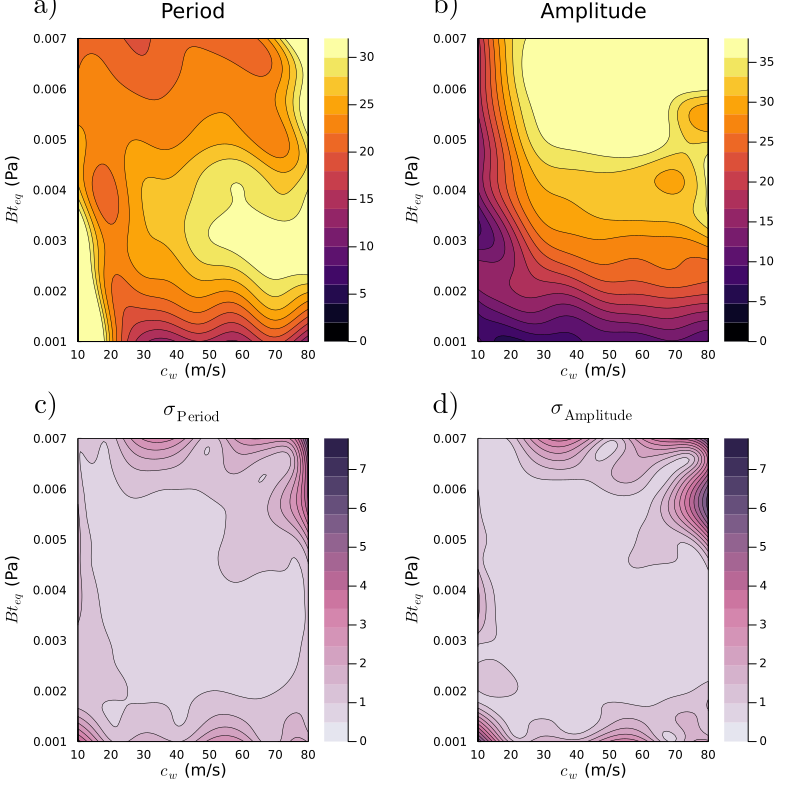

In [132]:
all_plots = Any[]
gr(size = (800, 800))
levels= [[0, 5], [0, 5] ]

x = (collect(range(10, 80, length=100)))
y = (collect(range(0.001, 0.007, length=100)))
clims_ = [(0, 32), (0, 38)]
clims_sd = [(0, 7.8), (0, 7.8)]
labels = ["a)", "b)"]
u_names = ["cwtropics", "Bt_eq"]
u_display_names = [L"$c_{w}$", L"$Bt_{eq}$"]
u_units = ["(m/s)", "(Pa)"]
u_lims = [(10, 80), (0.001, 0.007)]
n_params = length(u_names)

y_names = ["period", "amplitude"]
y_display_names = ["Period", "Amplitude"]
y_units = ["(months)", "(m/s)"]
y_lims = [(10, 30), (5, 35)]

for j in 1:n_outputs
    g_j = g_tp[j, :]
    Z = (g_j)
    function f(x,y)
        out, out_var = Emulators.predict(
        emulator, (hcat(x,y)');
        transform_to_real=true)
        return_val = out[j,:][1]
        if return_val < clims_[j][1]
            return_val =  clims_[j][1]
        end
        if return_val > clims_[j][2]
            return_val =  clims_[j][2]
        end 
        return_val
    end
    p1 = contour(x, y, f;
        fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
        title=y_display_names[j], clims=clims_[j],  linewidth=0.5 )
    
    annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

    push!(all_plots, p1)
end

labels = ["c)", "d)"]

# Plot uncertainties below
for j in 1:n_outputs
    g_j = g_tp[j, :]
    Z = (g_j)
    function f(x,y)
        out, out_var = Emulators.predict(
        emulator, (hcat(x,y)');
        transform_to_real=true)
        return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
        """if return_val < clims_sd[j][1]
            return_val =  clims_sd[j][1]
        end
        if return_val > clims_sd[j][2]
            return_val =  clims_sd[j][2]
    end""" 
        return_val
    end
    y_display_name = y_display_names[j]

    p1 = contour(x, y, f;
        fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
        title=L"$\sigma_{\mathrm{%$y_display_name}}$",  clims=clims_sd[j], linewidth=0.5, colorbar=:true,
        c=cgrad(:acton, rev=true) , linecolor=:black) #, extendhigh=:black)
    
    ## Add contours beyond clims 
    """function f_unclipped(x,y)
        out, out_var = Emulators.predict(
        emulator, log.(hcat(x,y)');
        transform_to_real=true)
        return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
        
        return_val
    end
    contour!(p1, x, y, f_unclipped; 
        fill=false, clims=(0, 20),  c=:black, colorbar=false, linewidth=0.5)"""
    
    annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

    push!(all_plots, p1)
end



plot_all = plot(all_plots..., layout = (2,2), size=(800, 800))
#savefig(plot_all,"../output/GP_contour.png")
display(plot_all)



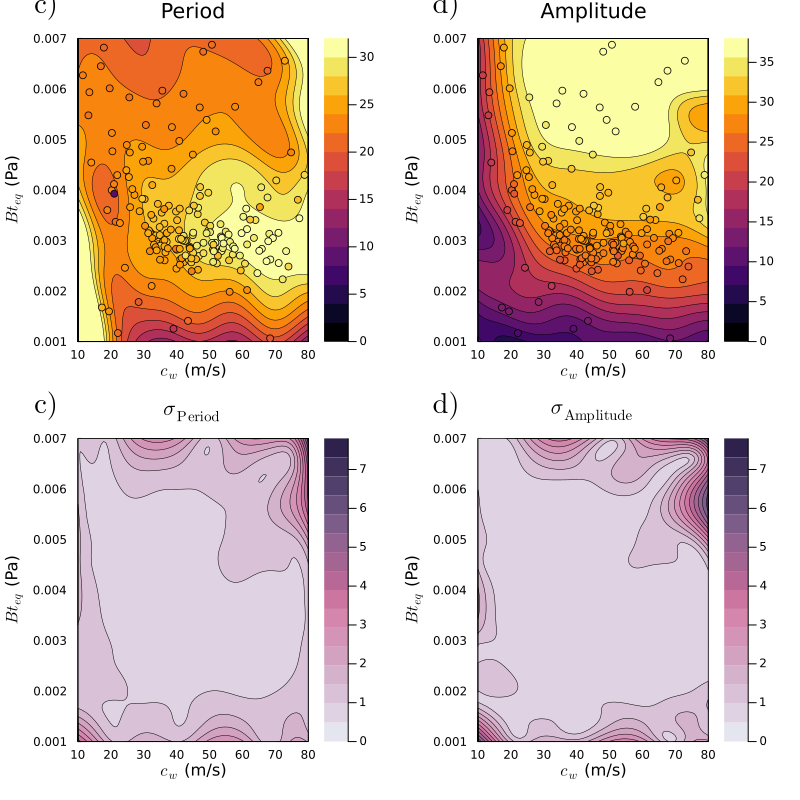

In [133]:
all_plots = Any[]

for j in 1:n_outputs
    g_j = g_tp[j, :]
    Z = (g_j)
    function f(x,y)
        out, out_var = Emulators.predict(
        emulator, (hcat(x,y)');
        transform_to_real=true)
        return_val = out[j,:][1]
        if return_val < clims_[j][1]
            return_val =  clims_[j][1]
        end
        if return_val > clims_[j][2]
            return_val =  clims_[j][2]
        end 
        return_val
    end
    p1 = contour(x, y, f;
        fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
        title=y_display_names[j], clims=clims_[j],  linewidth=0.5 )
    
    annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))
    
    scatter!(u_tp[1,:], u_tp[2,:], color = :inferno, 
             zcolor=g_tp[j,:], clims=clims_[j], label=:false , xlims = u_lims[1],  
    ylims= u_lims[2], widen=:false, markerstrokewidth=0.5)

    push!(all_plots, p1)
end

labels = ["c)", "d)"]

# Plot uncertainties below
for j in 1:n_outputs
    g_j = g_tp[j, :]
    Z = (g_j)
    function f(x,y)
        out, out_var = Emulators.predict(
        emulator, (hcat(x,y)');
        transform_to_real=true)
        return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
        """if return_val < clims_sd[j][1]
            return_val =  clims_sd[j][1]
        end
        if return_val > clims_sd[j][2]
            return_val =  clims_sd[j][2]
    end""" 
        return_val
    end
    y_display_name = y_display_names[j]

    p1 = contour(x, y, f;
        fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
        title=L"$\sigma_{\mathrm{%$y_display_name}}$",  clims=clims_sd[j], linewidth=0.5, colorbar=:true,
        c=cgrad(:acton, rev=true) , linecolor=:black) #, extendhigh=:black)
    
    ## Add contours beyond clims 
    """function f_unclipped(x,y)
        out, out_var = Emulators.predict(
        emulator, log.(hcat(x,y)');
        transform_to_real=true)
        return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
        
        return_val
    end
    contour!(p1, x, y, f_unclipped; 
        fill=false, clims=(0, 20),  c=:black, colorbar=false, linewidth=0.5)"""
    
    annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

    push!(all_plots, p1)
end



plot_all = plot(all_plots..., layout = (2,2), size=(800, 800))
#savefig(plot_all,"../output/GP_contour_with_points.png")
display(plot_all)



## Sample
Next, we need to sample from the posterior distribution using MCMC. We use the emulator to sample from



In [134]:
using CalibrateEmulateSample.MarkovChainMonteCarlo
using CalibrateEmulateSample.Observations
using CalibrateEmulateSample.Utilities
using CalibrateEmulateSample.ParameterDistributionStorage
using CalibrateEmulateSample.DataStorage

In [135]:
## Prior
prior_Bt_eq = Distributions.Uniform(0.001, 0.007)
prior_cw_tropics = Distributions.Uniform(5, 80)
priors_parameterized = [Parameterized(prior_cw_tropics), Parameterized(prior_Bt_eq)]
constraints = [ [no_constraint()] , [no_constraint()] ]
param_names = ["cwtropics", "Bt_eq"]
priors = ParameterDistribution(priors_parameterized, constraints, param_names )

ParameterDistribution{Parameterized, EnsembleKalmanProcesses.ParameterDistributionStorage.ConstraintType, String}(Parameterized[Parameterized(Uniform{Float64}(a=5.0, b=80.0)), Parameterized(Uniform{Float64}(a=0.001, b=0.007))], EnsembleKalmanProcesses.ParameterDistributionStorage.ConstraintType[Constraint(EnsembleKalmanProcesses.ParameterDistributionStorage.var"#5#7"(), EnsembleKalmanProcesses.ParameterDistributionStorage.var"#6#8"()), Constraint(EnsembleKalmanProcesses.ParameterDistributionStorage.var"#5#7"(), EnsembleKalmanProcesses.ParameterDistributionStorage.var"#6#8"())], ["cwtropics", "Bt_eq"])

In [136]:
println(" **** SAMPLE **** ")
# initial values
u0 = vec(mean(get_inputs(input_output_pairs), dims=2))
#u0 = Vector([50, 1e-3])
println("initial parameters: ", u0)

# MCMC settingsa
mcmc_alg = "rwm" # random walk Metropolis

# First let's run a short chain to determine a good step size
burnin = 0
step = 0.1 # first guess
max_iter = 2000 # number of steps before checking acc/rej rate for step size determination
yt_sample = truth   # the data (here it is the truth in the perfect model setting)
mcmc_test = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, step, u0, max_iter, 
                         mcmc_alg, burnin, svdflag=true)
new_step = MarkovChainMonteCarlo.find_mcmc_step!(mcmc_test, emulator, max_iter=max_iter)

# Now begin the actual MCMC
println("Begin MCMC - with step size ", new_step)
burnin = 1000
max_iter = 100000
mcmc = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, new_step, u0, max_iter, mcmc_alg,
                    burnin, svdflag=true)
MarkovChainMonteCarlo.sample_posterior!(mcmc, emulator, max_iter)

posterior = MarkovChainMonteCarlo.get_posterior(mcmc)

post_mean = get_mean(posterior)
post_cov = get_cov(posterior)

println("prior mean")
println(get_mean(mcmc.prior))
println("prior covariance")
println(get_cov(mcmc.prior))

println("posterior mean")
println(post_mean)
println("posterior covariance")
println(post_cov)



 **** SAMPLE **** 
initial parameters: [43.84321593153919, 0.003469126167559875]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.858901395237694, 24.059351584656362]
Begin step size search
iteration 0; current parameters [43.84321593153919 0.003469126167559875]
iteration 2000; acceptance rate = 0.512743628185907, current parameters [50.80746267127737; 0.002375444609455113;;]
new step size: 0.2
iteration 2000; acceptance rate = 0.25037481259370314, current parameters [34.68875984443265; 0.0029284380378436932;;]
Begin MCMC - with step size 0.2
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 

In [137]:
posterior_samples_1 = dropdims(get_distribution(posterior)[param_names[1]],
                                         dims=1)
posterior_samples_2 = dropdims(get_distribution(posterior)[param_names[2]],
                                                                        dims=1) 
posterior_samples_all = hcat(posterior_samples_1, posterior_samples_2)
println(size(posterior_samples_all))


(99001, 2)


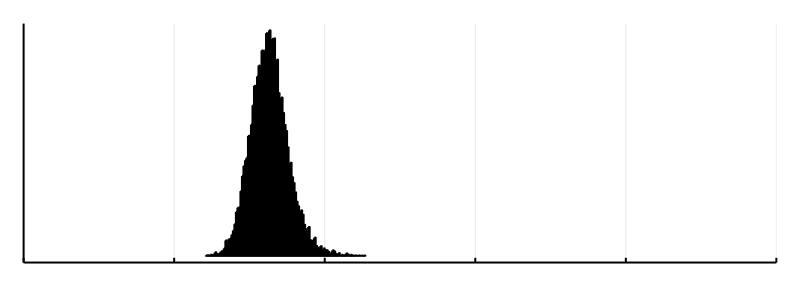

In [138]:
xs = collect(range(10.0, stop=70., length=1000))

posterior_samples =(posterior_samples_2[1000:90000])
mcmc_prior_dist = prior_Bt_eq #(prior_cw_tropics)
tophist=histogram(posterior_samples, bins=100, normed=true, fill=:lightgray, xlim=(0.001, 0.006),
              thickness_scaling=2.0, lab="Posterior", legend=:false,
    xtickfontsize=8, ytickfontsize=8, yaxis=nothing)
#plot!(tophist,xs, pdf.(mcmc_prior_dist, xs), w=2.6, color=:blue, lab="Prior")
#plot!(tophist,[u_truth[1]], seriestype="vline", w=2.6, lab="Truth")
#title!(tophist, u_display_names[1])
# remove ticks
plot!(tophist, yformatter=_->"")
plot!(tophist, xformatter=_->"")

plot(tophist, size=(800, 300))

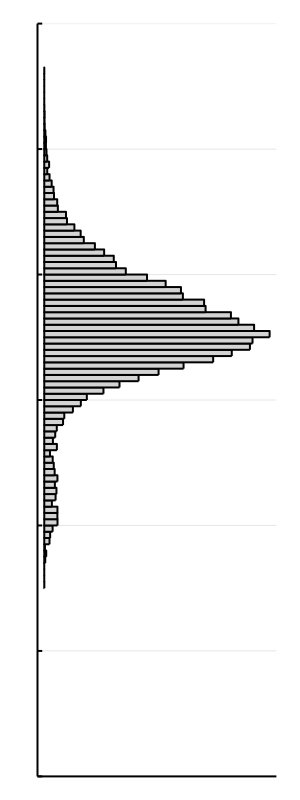

In [139]:
xs = collect(range(10.0, stop=70., length=1000))

posterior_samples =(posterior_samples_1[1000:90000])
mcmc_prior_dist = prior_cw_tropics # (prior_Bt_eq)
righthist=histogram(posterior_samples, bins=100, normed=true, fill=:lightgray, ylim=(10, 70),
              thickness_scaling=2.0,  legend=:false, orientation=:h, lab=:false,  
    xtickfontsize=8, ytickfontsize=8, xrotation=45, xaxis=nothing)
#plot!(righthist, pdf.(mcmc_prior_dist, xs),  xs, w=2.6, color=:blue, lab=:false)
#plot!(righthist, [u_truth[2]], seriestype="hline", w=2.6, lab=:false)
# Remove ticks
plot!(righthist, yformatter=_->"")
plot!(righthist, xformatter=_->"")

#title!(righthist, u_display_names[2], orientation=:v)
plot(righthist, size=(300, 800))

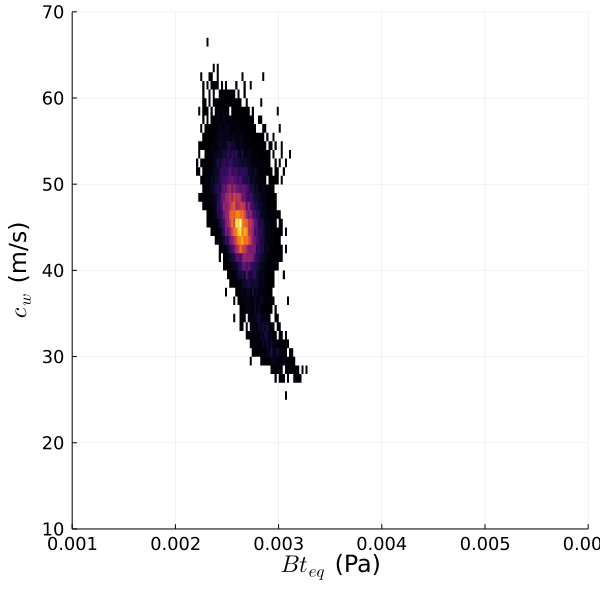

In [140]:
hist2d=histogram2d(posterior_samples_2[1000:90000], posterior_samples_1[1000:90000]; 
      label=:false, xlabel=u_display_names[2]*" "*u_units[2], ylabel=u_display_names[1]*" "*u_units[1],
    ylim=(10, 70), xlim=(0.001, 0.006),  xtickfontsize=12, ytickfontsize=12,
   # c = cgrad(:inferno, rev=true),
    xguidefontsize=16,  yguidefontsize=16, colorbar=:false) #, title="Gravity wave parameters")


plot(hist2d, size=(600,600))


In [141]:
layout = @layout [tophist{0.8w,0.2h} _
                  hist2d{0.8w,0.8h} righthist{0.2w,0.8h}]



2×2 Matrix{Any}:
 (label = :tophist, width = 0.8, height = 0.2)  …  (label = :_, blank = true)
 (label = :hist2d, width = 0.8, height = 0.8)      (label = :righthist, width = 0.2, height = 0.8)

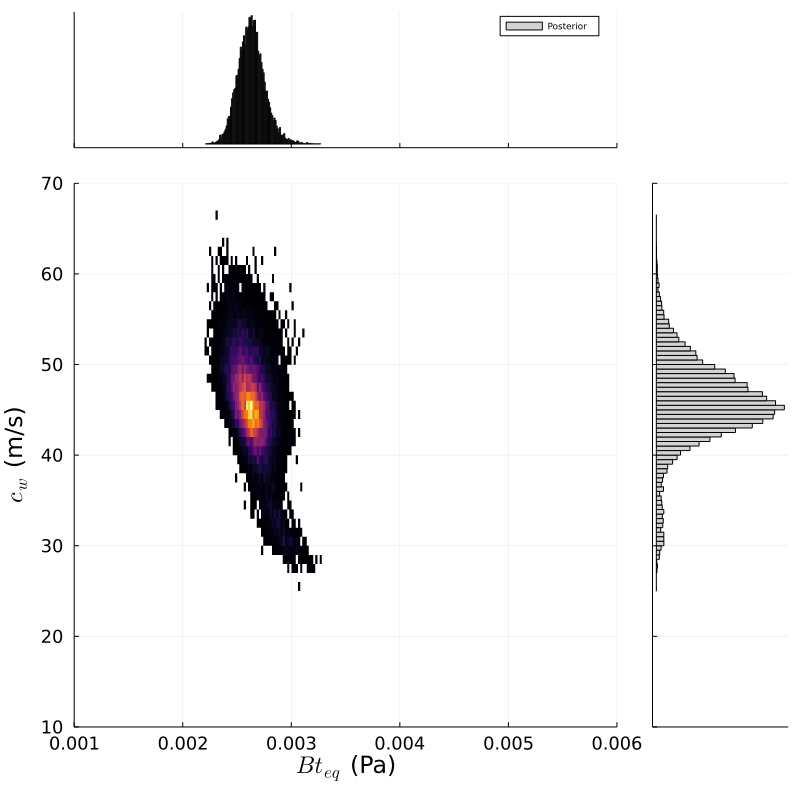

In [142]:
plot_all = plot( tophist, hist2d, righthist, 
    layout=layout, 
    size=(800, 800), 
    legend = :true,  legendfont=font(6, "Computer Modern")) #,  
    #plot_title="Posterior Distribution", titlefont=font(18, "Computer Modern"))
##savefig(plot_all,"../output/samples.png")
display(plot_all)

## How do plots change at each iteration? 

In [143]:
function emulator_at_iter(u, g_ens, n_iter)
    # Get the input parameters 
    u_iter = u[1:n_iter,:,:]
    g_iter = g_ens[1:n_iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * n_iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * n_iter))

    input_output_pairs = PairedDataContainer(u_tp, g_tp, data_are_columns=true)
    @assert get_inputs(input_output_pairs) == u_tp
    @assert get_outputs(input_output_pairs) == g_tp
    println(" **** EMULATE ****")
    println("Starting Gaussian Process Regression")
    gppackage = Emulators.GPJL()
    pred_type = Emulators.YType()
    gauss_proc = GaussianProcess(
        gppackage; 
        kernel=nothing, # use default squared exponential kernel
        prediction_type=pred_type, 
        noise_learn=false
    )


    emulator = Emulator(
        gauss_proc,
        input_output_pairs,
        obs_noise_cov=Γy,
        normalize_inputs=true
    )
    optimize_hyperparameters!(emulator)

      
    emulator
end

emulator_at_iter (generic function with 1 method)

In [144]:
size(u), size(g_ens)

((4, 50, 2), (4, 50, 2))

In [145]:
all_emulators = Any[]
for n_iter in 1:(N_iter)
    println("iteration $(n_iter)")
    emulator = emulator_at_iter(u, g_ens, n_iter)
    push!(all_emulators, emulator)
end

iteration 1
 **** EMULATE ****
Starting Gaussian Process Regression
Using default squared exponential kernel, learning length scale and variance parameters
Using default squared exponential kernel: Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]
kernel in GaussianProcess:
Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]
created GP: 1
kernel in GaussianProcess:
Type: GaussianProcesses.SEArd{Float64}, Params: [-0.0, -0.0, 0.0]
created GP: 2
LinearAlgebra.PosDefException(3)
optimized hyperparameters of GP: 1
Type: GaussianProcesses.SEArd{Float64}, Params: [-0.4607501018431133, 0.6134459640647177, 3.7527790926790363]
LinearAlgebra.PosDefException(8)
LinearAlgebra.PosDefException(13)
optimized hyperparameters of GP: 2
Type: GaussianProcesses.SEArd{Float64}, Params: [-0.8956793918003538, 0.47210510061438954, 3.4708852807030555]
iteration 2
 **** EMULATE ****
Starting Gaussian Process Regression
Using default squared exponential kernel, learning length scale

In [146]:
# Create test to cover entire parameter space
test_points_cwtropics = shuffle(collect(range(0, 80, length=100)))
test_points_Bt_eq = shuffle(collect(range(0.001, 0.008, length=100)))
test_points = hcat(test_points_cwtropics, test_points_Bt_eq)'

2×100 adjoint(::Matrix{Float64}) with eltype Float64:
 69.4949      28.2828      67.0707      …  66.2626      15.3535
  0.00460606   0.00283838   0.00467677      0.00729293   0.00177778

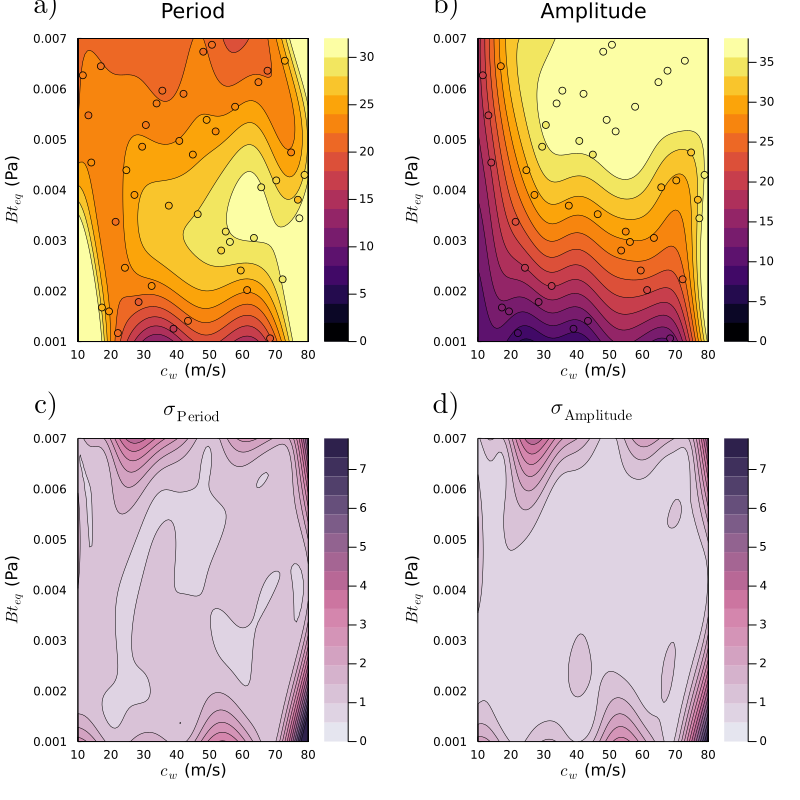

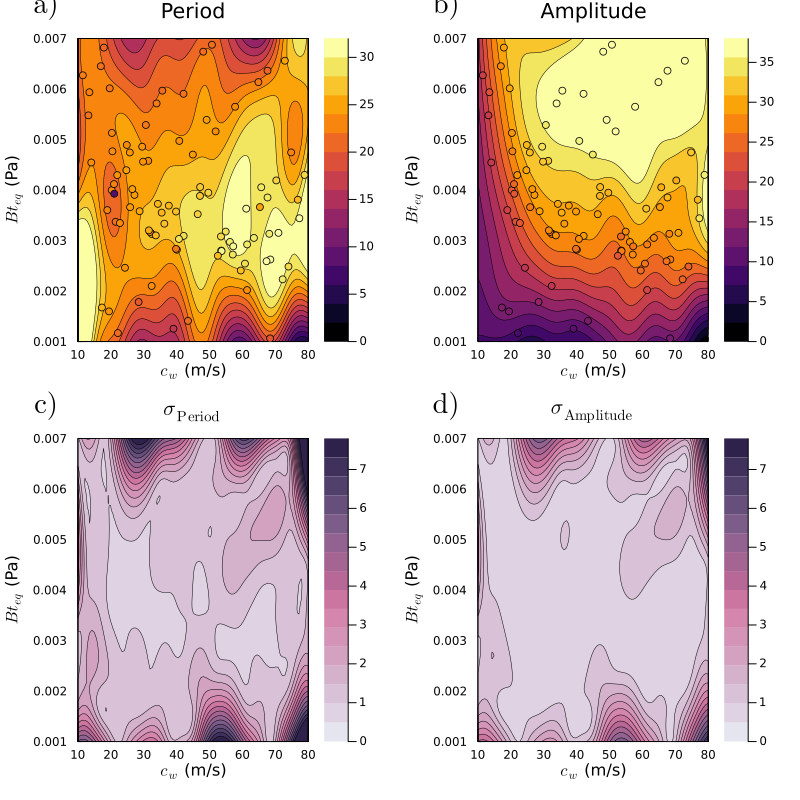

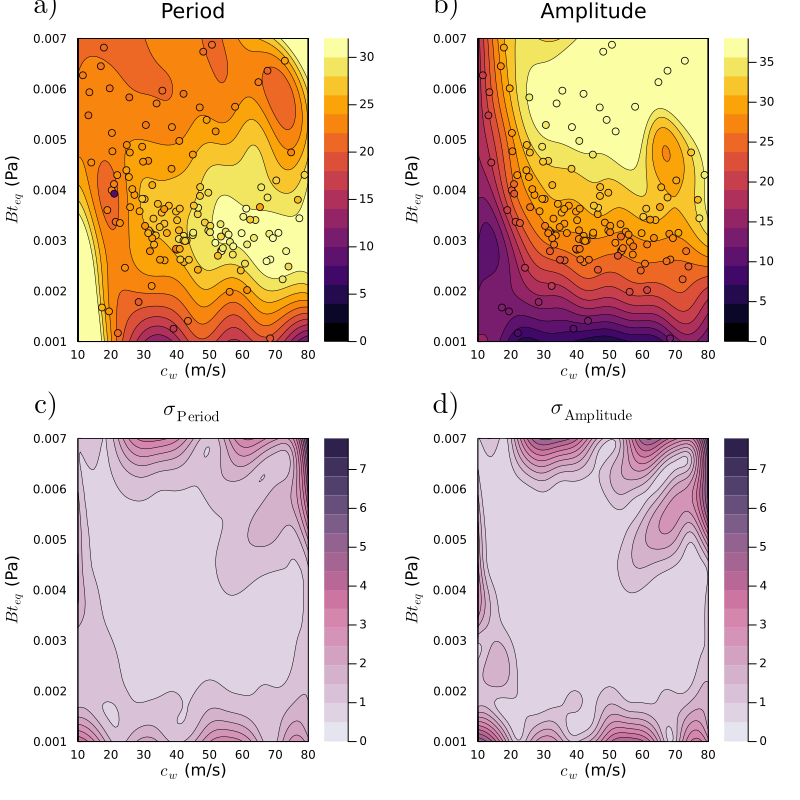

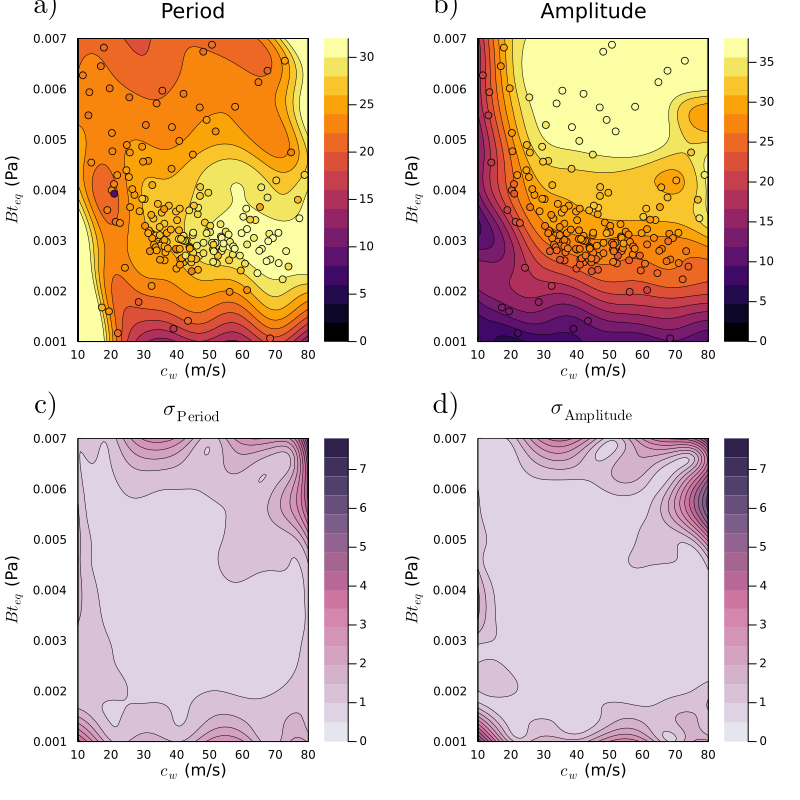

1
2
3
4


In [147]:
for (iter, emulator) in enumerate(all_emulators)
    println(iter)
    
    # Get the input parameters 
    u_iter = u[1:iter,:,:]
    g_iter = g_ens[1:iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * iter))
    
    y_mean_test, y_var_test = Emulators.predict(
        emulator, test_points;
        transform_to_real=true
    )

    all_plots = Any[]
    
    labels = ["a)", "b)"]

    for j in 1:n_outputs
        g_j = g_tp[j, :]
        Z = (g_j)
        function f(x,y)
            out, out_var = Emulators.predict(
            emulator, (hcat(x,y)');
            transform_to_real=true)
            return_val = out[j,:][1]
            if return_val < clims_[j][1]
                return_val =  clims_[j][1]
            end
            if return_val > clims_[j][2]
                return_val =  clims_[j][2]
            end 
            return_val
        end
        p1 = contour(x, y, f;
            fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
            title=y_display_names[j], clims=clims_[j],  linewidth=0.5 )

        annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

        scatter!(u_tp[1,:], u_tp[2,:], color = :inferno, 
                 zcolor=g_tp[j,:], clims=clims_[j], label=:false , xlims = u_lims[1],  
        ylims= u_lims[2], widen=:false, markerstrokewidth=0.5)

        push!(all_plots, p1)
    end

    labels = ["c)", "d)"]

    # Plot uncertainties below
    for j in 1:n_outputs
        g_j = g_tp[j, :]
        Z = (g_j)
        function f(x,y)
            out, out_var = Emulators.predict(
            emulator, (hcat(x,y)');
            transform_to_real=true)
            return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
            """if return_val < clims_sd[j][1]
                return_val =  clims_sd[j][1]
            end
            if return_val > clims_sd[j][2]
                return_val =  clims_sd[j][2]
        end""" 
            return_val
        end
        y_display_name = y_display_names[j]

        p1 = contour(x, y, f;
            fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
            title=L"$\sigma_{\mathrm{%$y_display_name}}$",  clims=clims_sd[j], linewidth=0.5, colorbar=:true,
            c=cgrad(:acton, rev=true) , linecolor=:black) #, extendhigh=:black)

        ## Add contours beyond clims 
        """function f_unclipped(x,y)
            out, out_var = Emulators.predict(
            emulator, log.(hcat(x,y)');
            transform_to_real=true)
            return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]

            return_val
        end
        contour!(p1, x, y, f_unclipped; 
            fill=false, clims=(0, 20),  c=:black, colorbar=false, linewidth=0.5)"""

        annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

        push!(all_plots, p1)
    end



    plot_all = plot(all_plots..., layout = (2,2), size=(800, 800))
    savefig(plot_all, "$(plotdir)/GP_contour_with_points_iter_$(iter).png")
    display(plot_all)
    

end



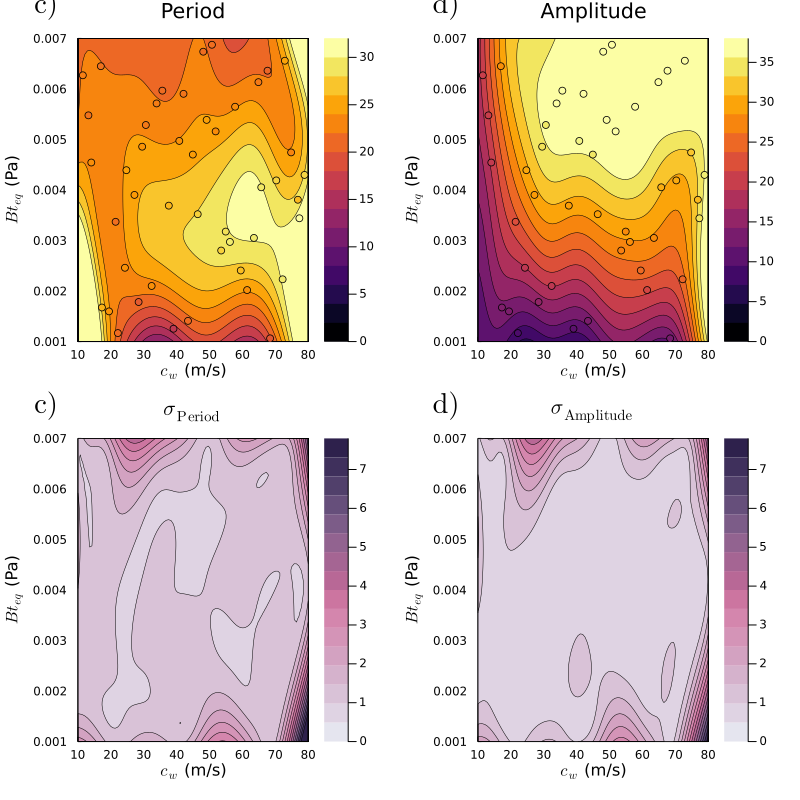

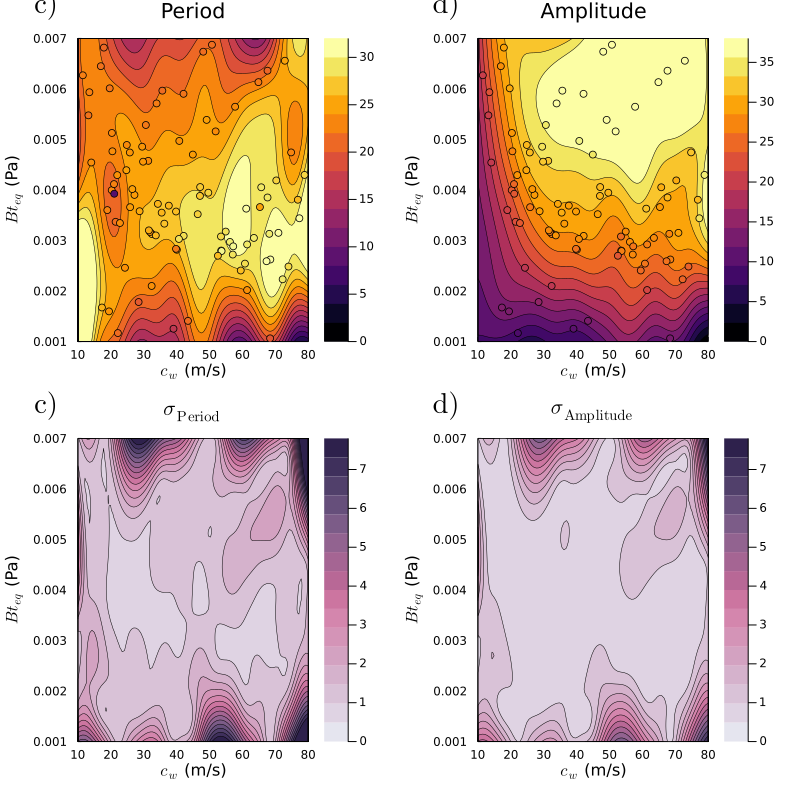

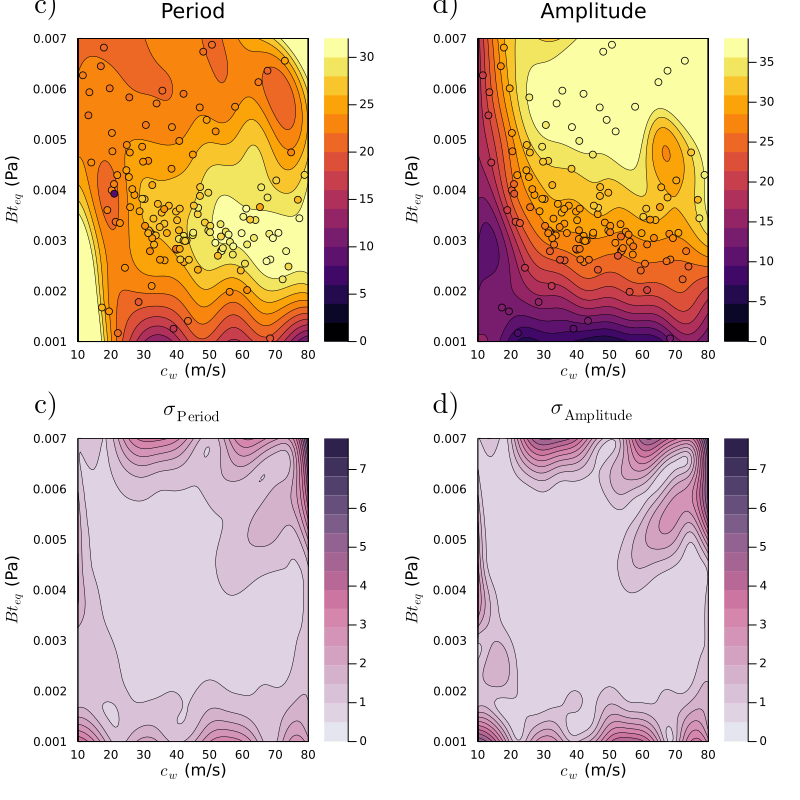

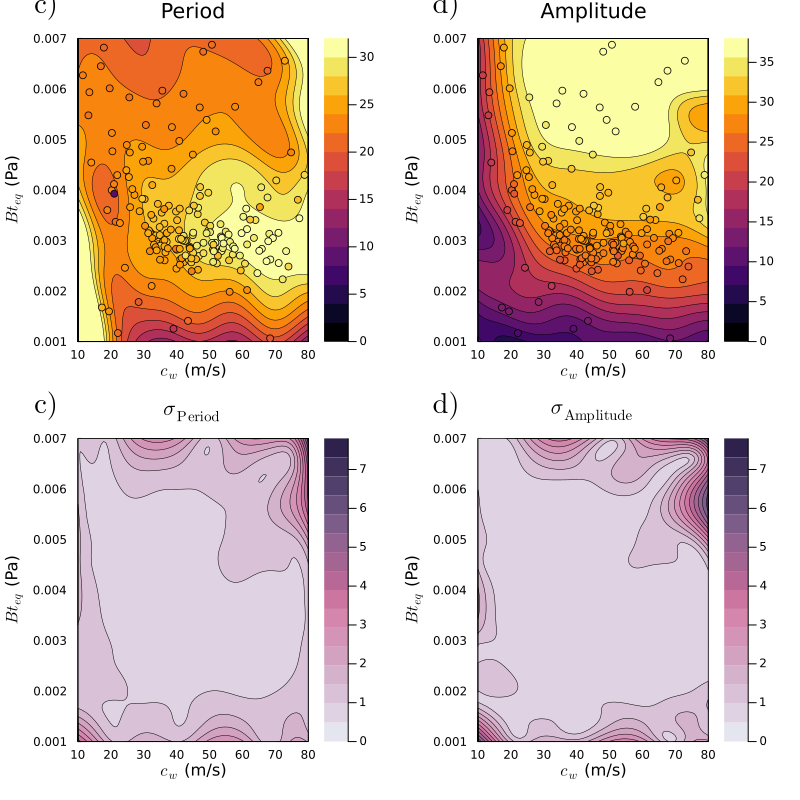

1
2
3
4


In [149]:
for (iter, emulator) in enumerate(all_emulators)
    println(iter)
    
    # Get the input parameters 
    u_iter = u[1:iter,:,:]
    g_iter = g_ens[1:iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * iter))
    
    y_mean_test, y_var_test = Emulators.predict(
        emulator, test_points;
        transform_to_real=true
    )

    all_plots = Any[]

    for j in 1:n_outputs
        g_j = g_tp[j, :]
        Z = (g_j)
        function f(x,y)
            out, out_var = Emulators.predict(
            emulator, (hcat(x,y)');
            transform_to_real=true)
            return_val = out[j,:][1]
            if return_val < clims_[j][1]
                return_val =  clims_[j][1]
            end
            if return_val > clims_[j][2]
                return_val =  clims_[j][2]
            end 
            return_val
        end
        p1 = contour(x, y, f;
            fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
            title=y_display_names[j], clims=clims_[j],  linewidth=0.5 )

        annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

        scatter!(u_tp[1,:], u_tp[2,:], color = :inferno, 
                 zcolor=g_tp[j,:], clims=clims_[j], label=:false , xlims = u_lims[1],  
        ylims= u_lims[2], widen=:false, markerstrokewidth=0.5)

        push!(all_plots, p1)
    end

    labels = ["c)", "d)"]

    # Plot uncertainties below
    for j in 1:n_outputs
        g_j = g_tp[j, :]
        Z = (g_j)
        function f(x,y)
            out, out_var = Emulators.predict(
            emulator, (hcat(x,y)');
            transform_to_real=true)
            return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]
            """if return_val < clims_sd[j][1]
                return_val =  clims_sd[j][1]
            end
            if return_val > clims_sd[j][2]
                return_val =  clims_sd[j][2]
        end""" 
            return_val
        end
        y_display_name = y_display_names[j]

        p1 = contour(x, y, f;
            fill=true, xaxis=u_display_names[1]*" "*u_units[1], yaxis=u_display_names[2]*" "*u_units[2], 
            title=L"$\sigma_{\mathrm{%$y_display_name}}$",  clims=clims_sd[j], linewidth=0.5, colorbar=:true,
            c=cgrad(:acton, rev=true) , linecolor=:black) #, extendhigh=:black)

        ## Add contours beyond clims 
        """function f_unclipped(x,y)
            out, out_var = Emulators.predict(
            emulator, log.(hcat(x,y)');
            transform_to_real=true)
            return_val = [out_var[idx][j,j]^0.5 for idx in 1:length(out_var)][1]

            return_val
        end
        contour!(p1, x, y, f_unclipped; 
            fill=false, clims=(0, 20),  c=:black, colorbar=false, linewidth=0.5)"""

        annotate!(p1, 0, 0.007*1.1, text(labels[j], :black, :center, 18, "Computer Modern"))

        push!(all_plots, p1)
    end



    plot_all = plot(all_plots..., layout = (2,2), size=(800, 800))
    savefig(plot_all, "$(plotdir)/GP_contour_with_points_iter_$(iter).png")
    display(plot_all)
    

end



1
 **** SAMPLE **** 
initial parameters: [42.517160742827556, 0.003996305573245798]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.858901395237694, 24.059351584656362]
Begin step size search
iteration 0; current parameters [42.517160742827556 0.003996305573245798]
iteration 2000; acceptance rate = 0.5617191404297851, current parameters [38.40883627087482; 0.0031939288652531052;;]
new step size: 0.2
iteration 2000; acceptance rate = 0.36081959020489757, current parameters [55.530702526949725; 0.0025832992657014273;;]
new step size: 0.4
iteration 2000; acceptance rate = 0.1679160419790105, current parameters [46.824246799974695; 0.0023129265061013963;;]


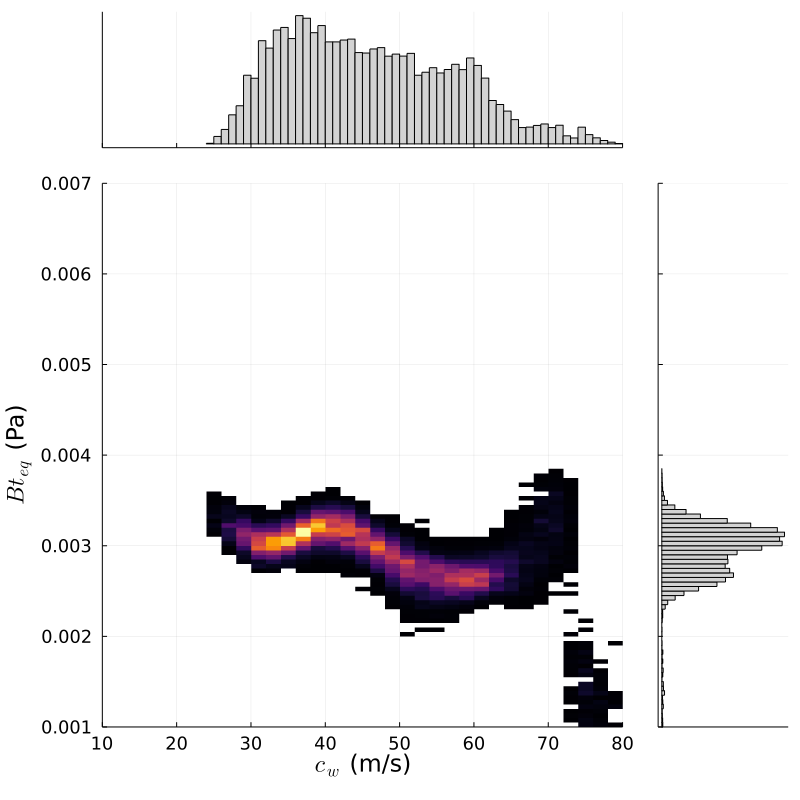

Begin MCMC - with step size 0.4
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.858901395237694, 24.059351584656362]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[46.169352531729636; 0.0029367162947474125;;]
posterior covariance
[128.66653996976075 0.0; 0.0 9.469911944929535e-8]
2
 **** SAMPLE **** 
initial parameters: [41.59169660933984, 0.003871597748375148]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.85890139

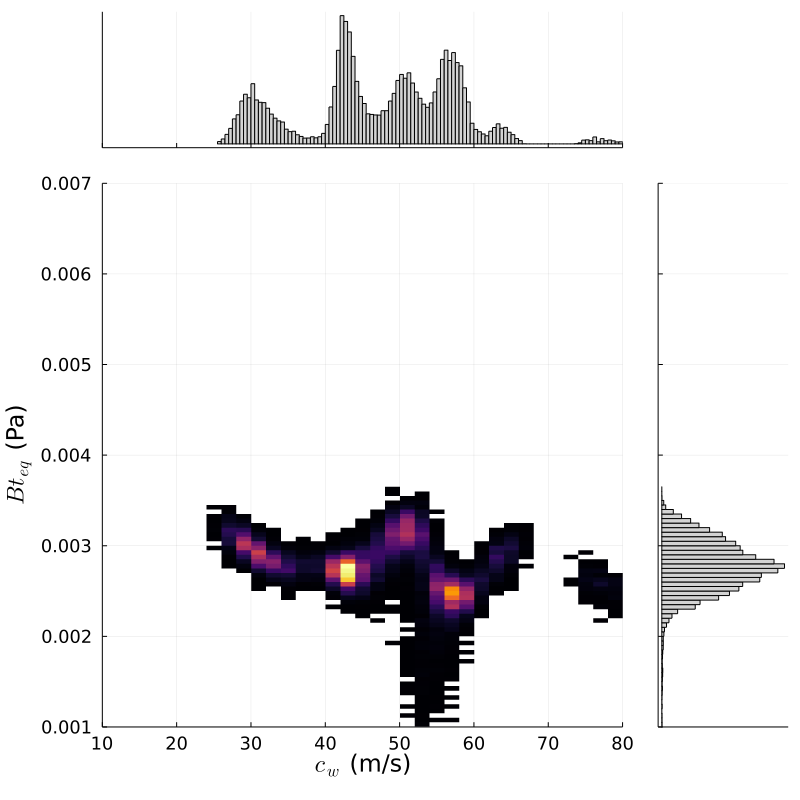

Begin MCMC - with step size 0.2
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.858901395237694, 24.059351584656362]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[46.89418118890323; 0.0027757559298858944;;]
posterior covariance
[107.71690817342949 0.0; 0.0 8.093636604721503e-8]
3
 **** SAMPLE **** 
initial parameters: [42.56812881628331, 0.003678757041768405]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.858901395

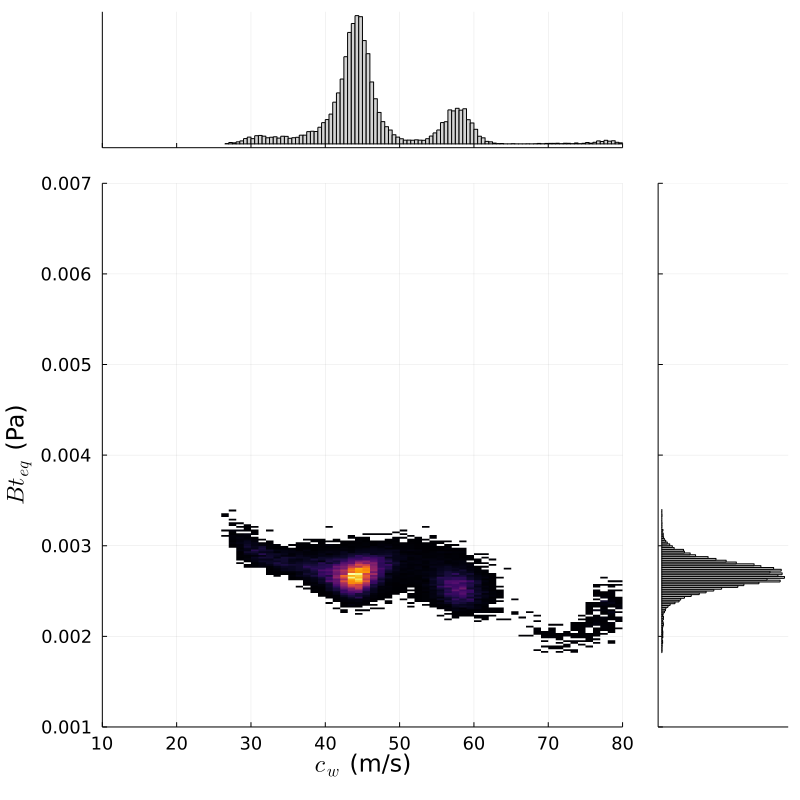

Begin MCMC - with step size 0.2
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.858901395237694, 24.059351584656362]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[46.43159745539282; 0.0026748880169040518;;]
posterior covariance
[58.69591794503962 0.0; 0.0 2.2263984655800825e-8]
4
 **** SAMPLE **** 
initial parameters: [43.84321593153919, 0.003469126167559875]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.858901395

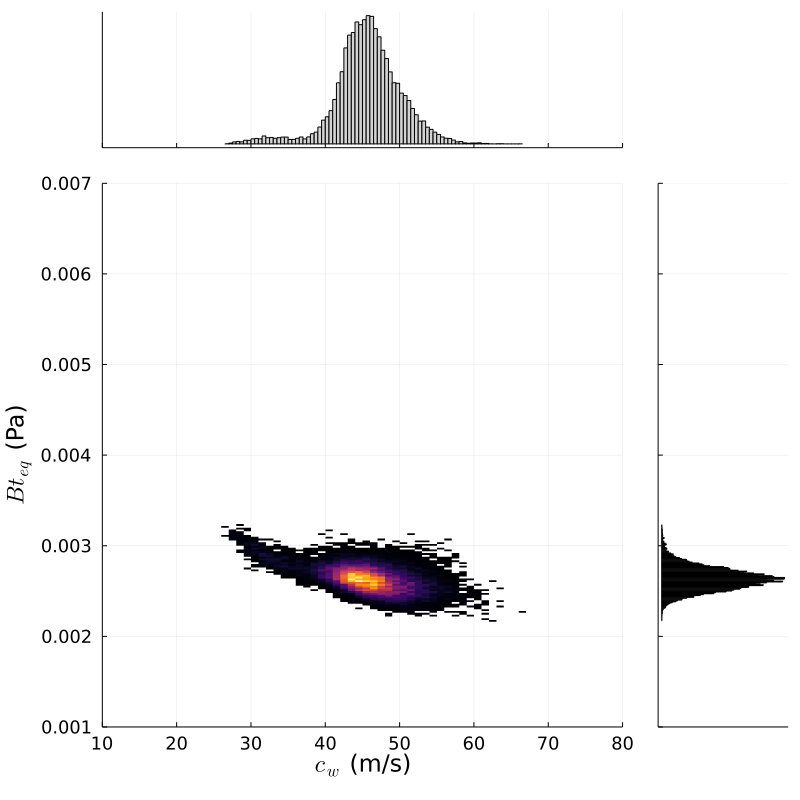

Begin MCMC - with step size 0.2
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
[27.475158018456685, 26.47962962962963]
[0.612958786677912 0.22564261633650484; 0.22564261633650484 0.30923261580668987]
Applying SVD to decorrelating outputs, if not required set svdflag=false
[-42.858901395237694, 24.059351584656362]
prior mean
[42.5, 0.004]
prior covariance
[468.75 0.0; 0.0 3.0e-6]
posterior mean
[45.64873997624645; 0.002633955828530446;;]
posterior covariance
[20.825008533996293 0.0; 0.0 1.5585191132415802e-8]


In [156]:
all_posterior_samples = Any[]
for (iter, emulator) in enumerate(all_emulators)
    println(iter)
    
    println(" **** SAMPLE **** ")
    # initial values
    # Get the input parameters 
    u_iter = u[1:iter,:,:]
    g_iter = g_ens[1:iter,:,:]

    # Get training points
    # Reshape u and g so that n_params and n_outputs come in first dimension
    u_tp = permutedims(u_iter, (3, 2, 1))
    g_tp = permutedims(g_iter, (3, 2, 1))

    ## Condense the iterations and ensembles to create one large training dataset
    u_tp = reshape(u_tp, (n_params, N_ens * iter) )
    g_tp = reshape(g_tp, (n_outputs, N_ens * iter))

    input_output_pairs = PairedDataContainer(u_tp, g_tp, data_are_columns=true)
    u0 = vec(mean(get_inputs(input_output_pairs), dims=2))
    #u0 = Vector([50, 1e-3])
    println("initial parameters: ", u0)

    # MCMC settingsa
    mcmc_alg = "rwm" # random walk Metropolis

    # First let's run a short chain to determine a good step size
    burnin = 0
    step = 0.1 # first guess
    max_iter = 2000 # number of steps before checking acc/rej rate for step size determination
    yt_sample = truth   # the data (here it is the truth in the perfect model setting)
    mcmc_test = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, step, u0, max_iter, 
                             mcmc_alg, burnin, svdflag=true)
    new_step = MarkovChainMonteCarlo.find_mcmc_step!(mcmc_test, emulator, max_iter=max_iter)

    # Now begin the actual MCMC
    println("Begin MCMC - with step size ", new_step)
    burnin = 1000
    max_iter = 100000
    mcmc = MarkovChainMonteCarlo.MCMC(yt_sample, Γy, priors, new_step, u0, max_iter, mcmc_alg,
                        burnin, svdflag=true)
    MarkovChainMonteCarlo.sample_posterior!(mcmc, emulator, max_iter)

    posterior = MarkovChainMonteCarlo.get_posterior(mcmc)

    post_mean = get_mean(posterior)
    post_cov = get_cov(posterior)

    println("prior mean")
    println(get_mean(mcmc.prior))
    println("prior covariance")
    println(get_cov(mcmc.prior))

    println("posterior mean")
    println(post_mean)
    println("posterior covariance")
    println(post_cov)
    
    posterior_samples_1 = dropdims(get_distribution(posterior)[param_names[1]],
                                         dims=1)
    posterior_samples_2 = dropdims(get_distribution(posterior)[param_names[2]],
                                                                            dims=1) 
    posterior_samples = hcat(posterior_samples_1, posterior_samples_2)

    push!(all_posterior_samples, posterior_samples)
    
    
    xs = collect(range(10.0, stop=70., length=1000))

    posterior_samples =(posterior_samples_1[1000:90000])
    mcmc_prior_dist = (prior_cw_tropics)
    tophist=histogram(posterior_samples, bins=100, normed=true, fill=:lightgray, xlim=(10, 80),
                  thickness_scaling=2.0, lab=:false, legend=:false,
        xtickfontsize=8, ytickfontsize=8, yaxis=nothing)
    #plot!(tophist,xs, pdf.(mcmc_prior_dist, xs), w=2.6, color=:blue, lab="Prior")
    #plot!(tophist,[u_truth[1]], seriestype="vline", w=2.6, lab="Truth")
    #title!(tophist, u_display_names[1])
    # remove ticks
    plot!(tophist, yformatter=_->"")
    plot!(tophist, xformatter=_->"")

    plot(tophist, size=(800, 300))

    xs = collect(range(10.0, stop=70., length=1000))

    posterior_samples =(posterior_samples_2[1000:90000])
    mcmc_prior_dist =  (prior_Bt_eq)
    righthist=histogram(posterior_samples, bins=100, normed=true, fill=:lightgray, ylim=(0.001, 0.007),
                  thickness_scaling=2.0,  legend=:false, orientation=:h, lab=:false,  
        xtickfontsize=8, ytickfontsize=8, xrotation=45, xaxis=nothing)
    #plot!(righthist, pdf.(mcmc_prior_dist, xs),  xs, w=2.6, color=:blue, lab=:false)
    #plot!(righthist, [u_truth[2]], seriestype="hline", w=2.6, lab=:false)
    # Remove ticks
    plot!(righthist, yformatter=_->"")
    plot!(righthist, xformatter=_->"")

    #title!(righthist, u_display_names[2], orientation=:v)
    plot(righthist, size=(300, 800))

    hist2d=histogram2d(posterior_samples_1[1000:90000], posterior_samples_2[1000:90000]; 
          label=:false, ylabel=u_display_names[2]*" "*u_units[2], xlabel=u_display_names[1]*" "*u_units[1],
        xlim=(10, 80), ylim=(0.001, 0.007),  xtickfontsize=12, ytickfontsize=12,
       # c = cgrad(:inferno, rev=true),
        xguidefontsize=16,  yguidefontsize=16, colorbar=:false) #, title="Gravity wave parameters")


    plot(hist2d, size=(600,600))
    
    layout = @layout [tophist{0.8w,0.2h} _
                  hist2d{0.8w,0.8h} righthist{0.2w,0.8h}]



    plot_all = plot( tophist, hist2d, righthist, 
        layout=layout, 
        size=(800, 800), 
        legend = :true,  legendfont=font(6, "Computer Modern"))# , #,  
        #plot_title="Posterior Distribution iteration $(iter)", titlefont=font(18, "Computer Modern"))
    ##savefig(plot_all,"../output/samples.png")
    savefig(plot_all, "$(plotdir)/2d_hist_posterior_samples_$(iter).png")

    display(plot_all)
end


